In [10]:
#Library imports

#pip install -r requirements.txt
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geopandas as gpd
import matplotlib.colors as mcolors
import contextily as ctx 


**Variables that could be of interest:**
- BIO1: Annual Mean Temperature
- BIO12: Annual Precipitation
- BIO5: Max Temperature of Warmest Month
- BIO6: Min Temperature of Coldest Month
- BIO15: Precipitation Seasonality (Coefficient of Variation)

In [11]:
env = pd.read_csv("train_locs_extended.csv")
env.head()
env.shape

(272037, 8)

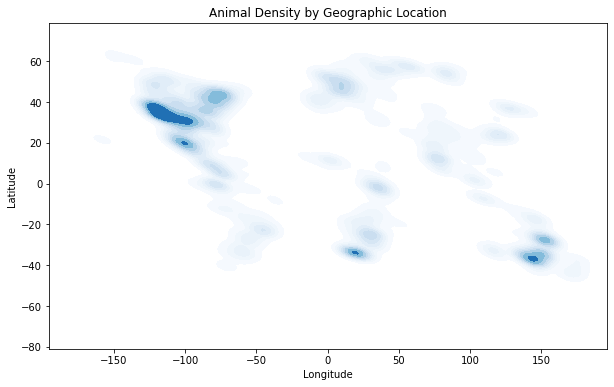

In [34]:
#Plotting the distribution 
plt.figure(figsize=(10, 6))
sns.kdeplot(x=env["Longitude"], y=env["Latitude"], cmap="Blues", fill=True, bw_adjust=0.5)
plt.title("Animal Density by Geographic Location")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

In [35]:
#Plotting interactive map
m = folium.Map(location=[env["Latitude"].mean(), env["Longitude"].mean()], zoom_start=5)

# Prepare data in a list of [lat, lon] format for HeatMap
locations = list(zip(env["Latitude"], env["Longitude"]))

# Add HeatMap
HeatMap(locations).add_to(m)

# Display map
m

In [12]:
#-3.400000e+38 is the placeholder value when the item is not found so we will filter them out of the dataset by filtering in one variable
env = env[env["BIO1"]>=-1000]
print(env.shape)
env.describe()

(271270, 8)


,ID,Latitude,Longitude,BIO1,BIO5,BI06,BIO12,BIO15
count,2.712700e+05,271270.000000,271270.000000,271270.000000,271270.000000,271270.000000,271270.000000,271270.000000
mean,7.871429e+04,15.648468,-16.886933,15.707566,28.918315,2.843024,972.572817,54.458195
std,1.776947e+05,30.584651,93.597597,6.861429,5.049729,10.013369,615.635532,32.651528
min,4.580000e+02,-75.284950,-178.060318,-32.551624,-15.046000,-47.058750,0.000000,0.000000
25%,1.024300e+04,-16.220957,-98.306633,10.858886,25.487499,-3.229750,560.000000,25.908491
50%,2.050400e+04,28.071896,-60.625946,16.273531,28.974501,4.135000,851.000000,48.182003
75%,4.352300e+04,39.116327,43.446354,20.546980,32.497126,8.922018,1214.000000,79.260826
max,1.368519e+06,73.222198,178.827591,30.227968,46.437595,26.200001,7089.000000,187.912338


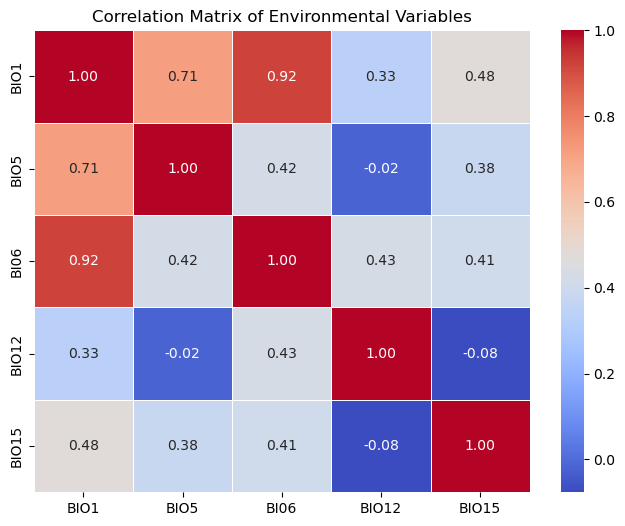

In [13]:
#Defining the environemntal variables
env_variables = env[['BIO1', 'BIO5', 'BI06', 'BIO12', 'BIO15']]

# Calculate the correlation matrix
correlation_matrix = env_variables.corr()

# Plotting the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix of Environmental Variables")
plt.show()

In [14]:
env_unique = env.drop_duplicates(subset=['Latitude', 'Longitude'])

In [18]:
env_unique.shape

(238145, 9)

### Kmeans Analysis on environmental factors

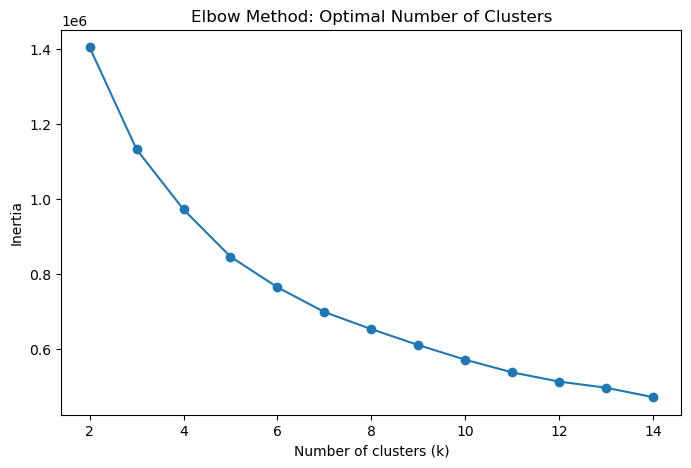

In [15]:
inertia = []
k_range = range(2, 15)

scaler = StandardScaler()
env_scaled = scaler.fit_transform(env_unique)  # Apply scaling

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(env_scaled)
    inertia.append(kmeans.inertia_)

#Plot the Elbow curve (Inertia vs. Number of Clusters)
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertia, marker='o')
plt.xlabel("Number of clusters (k)")
plt.ylabel("Inertia")
plt.title("Elbow Method: Optimal Number of Clusters")
plt.show()

In [29]:
# Based on optimal k (based on elbow plot) and run KMeans
optimal_k = 5  # Replace with the chosen number from the elbow plot
kmeans = KMeans(n_clusters=optimal_k, random_state=0, n_init=10)
env_unique['Cluster'] = kmeans.fit_predict(env_unique)

print(env_unique["Cluster"].value_counts())

Cluster
0    197558
3     24498
1     12029
4      2310
2      1750
Name: count, dtype: int64


C:\Users\annie\AppData\Local\Temp\ipykernel_12528\3410113663.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  env_unique['Cluster'] = kmeans.fit_predict(env_unique)


In [30]:
#really big cluster

# Step 1: Filter data to include only the largest cluster (cluster '0')
largest_cluster = env_unique[env_unique['Cluster'] == 0] #change this to detect automatically

# Step 2: Apply KMeans on this subset with 2 clusters
sub_kmeans = KMeans(n_clusters=2, random_state=0, n_init=10)
sub_clusters = sub_kmeans.fit_predict(largest_cluster)

# Step 3: Update the 'Cluster' column in env_unique for this subset
# Assign the new cluster labels as '2' and '5'
env_unique.loc[largest_cluster.index, 'Cluster'] = [0 if x == 0 else 5 for x in sub_clusters]

# Check the new distribution of clusters
print(env_unique['Cluster'].value_counts())

Cluster
5    121887
0     75671
3     24498
1     12029
4      2310
2      1750
Name: count, dtype: int64


C:\Users\annie\AppData\Local\Temp\ipykernel_12528\794178963.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  env_unique['geometry'] = env_unique.apply(lambda row: Point(row['Longitude'], row['Latitude']), axis=1)


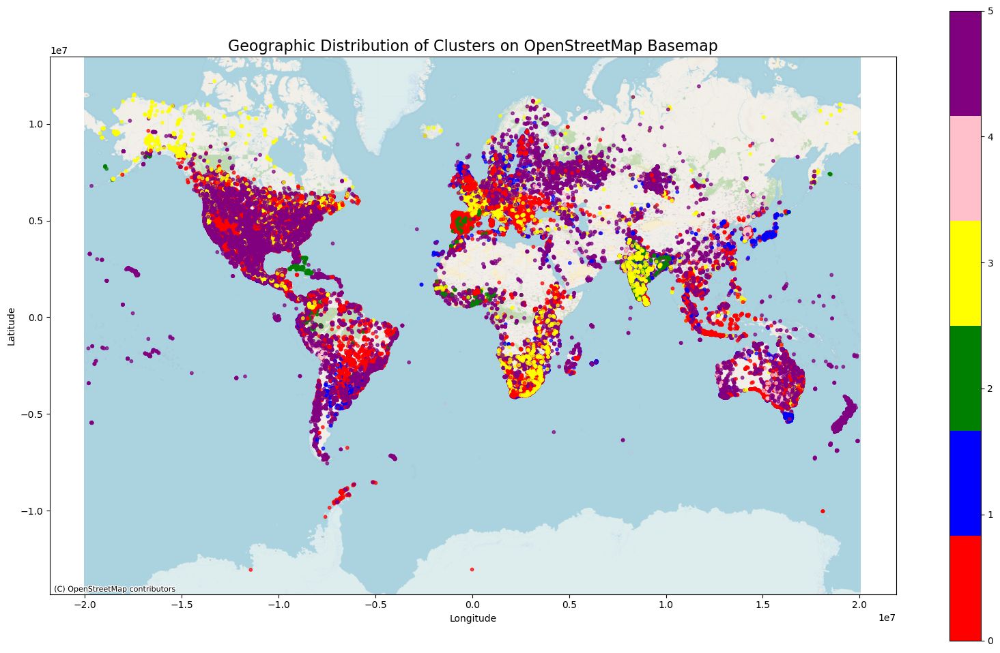

In [66]:
# This is all chatgpt - do not give me credit
#Step 1: Convert latitude and longitude to GeoDataFrame with appropriate projection
env_unique['geometry'] = env_unique.apply(lambda row: Point(row['Longitude'], row['Latitude']), axis=1)

gdf = gpd.GeoDataFrame(env_unique, geometry='geometry', crs="EPSG:4326")  # Set initial projection (WGS84)

# Step 2: Project the GeoDataFrame to Web Mercator (EPSG:3857) for compatibility with contextily
gdf = gdf.to_crs(epsg=3857)

# Define a custom colormap with 5 distinct colors: red, blue, green, yellow, and pink
custom_colors = mcolors.ListedColormap(['red', 'blue', 'green', 'yellow', 'pink', 'purple'])

# Step 3: Plot with OpenStreetMap basemap using contextily
fig, ax = plt.subplots(figsize=(20, 12))  # Larger figure size

# Plot the clusters with distinct colors
gdf.plot(column='Cluster', cmap=custom_colors, markersize=10, alpha=0.7, legend=True, ax=ax)

# Add an OpenStreetMap basemap
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, zoom=6)  # Using OpenStreetMap

# Set labels
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.title("Geographic Distribution of Clusters on OpenStreetMap Basemap", fontsize=16)
plt.show()

In [31]:
env_unique_selected = env_unique[['ID', 'Latitude', 'Longitude', 'Cluster']]
env_selected = env[['Latitude', 'Longitude', 'BIO1', 'BIO5', 'BI06', 'BIO12', 'BIO15']]

# Perform the merge with only selected columns, avoiding _x and _y suffixes
env_final = pd.merge(env_unique_selected, env_selected, on=["Latitude", "Longitude"], how="left")

# Display the resulting DataFrame's shape and columns to verify
print(env_final.shape)
print(env_unique.shape)
print(env.shape)

env_final.head()

(271270, 9)
(238145, 9)
(271270, 8)


,ID,Latitude,Longitude,Cluster,BIO1,BIO5,BI06,BIO12,BIO15
0,31529,-18.286728,143.481247,0,25.830833,36.812252,12.26175,778.0,118.931313
1,31529,-18.286728,143.481247,0,25.830833,36.812252,12.26175,778.0,118.931313
2,31529,-18.286728,143.481247,0,25.830833,36.812252,12.26175,778.0,118.931313
3,31529,-18.286728,143.481247,0,25.830833,36.812252,12.26175,778.0,118.931313
4,31529,-18.286728,143.481247,0,25.830833,36.812252,12.26175,778.0,118.931313


### Analyzing the clusters based on environemnt

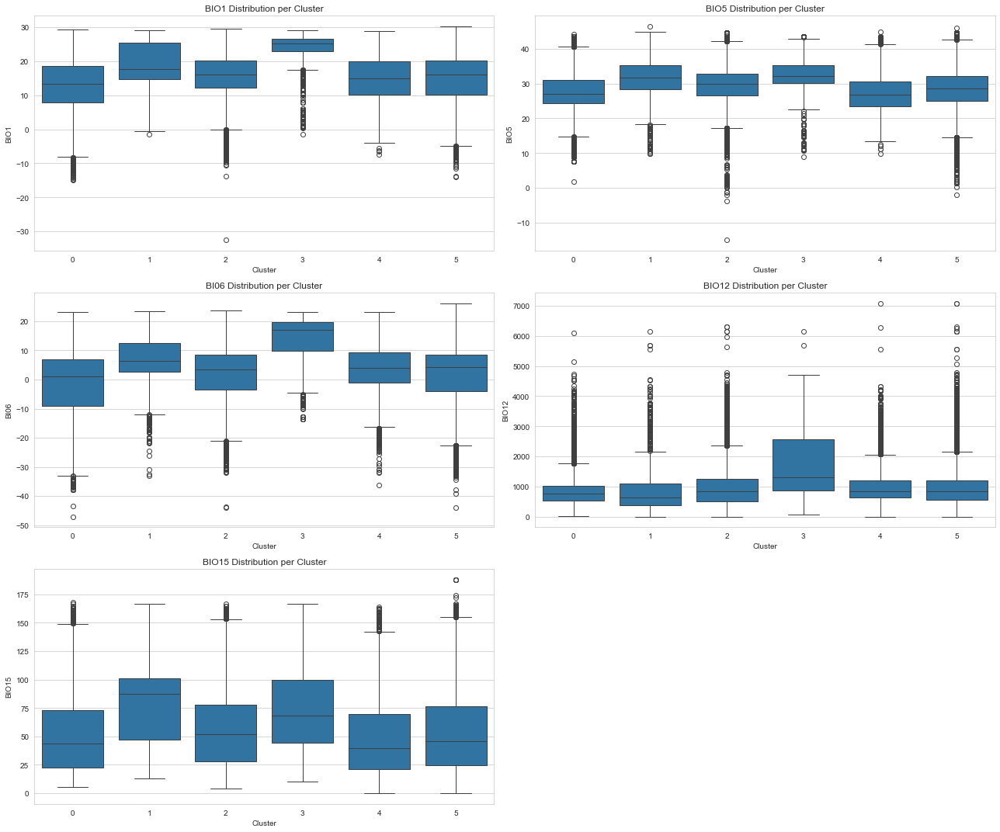

In [101]:
plt.figure(figsize=(18, 15))  # Increase the figure size for larger plots
sns.set_style("whitegrid")

for i, factor in enumerate(env_variables, 1):
    plt.subplot(3, 2, i)  # Arrange subplots in a grid (3 rows x 2 columns)
    sns.boxplot(data=env_unique, x='Cluster', y=factor)
    plt.title(f'{factor} Distribution per Cluster')
    plt.xlabel('Cluster')
    plt.ylabel(factor)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

In [33]:
cluster_summary = env_unique.groupby('Cluster').agg({
    'BIO1': ['mean', 'std'],
    'BIO5': ['mean', 'std'],
    'BI06': ['mean', 'std'],
    'BIO12': ['mean', 'std'],
    'BIO15': ['mean', 'std']
}).reset_index()
cluster_summary

Cluster       BIO1                 BIO5                 BI06             \
                mean       std       mean       std       mean        std   
0       0  16.016266  6.199442  29.607892  4.684750   2.935169   9.393586   
1       1  15.419202  6.453691  27.102515  4.738638   4.466979   8.419552   
2       2  23.655306  5.160323  32.531262  5.492299  14.458129   6.977268   
3       3  12.982285  7.417086  27.593522  4.975649  -1.173512  10.752769   
4       4  18.596392  7.049159  31.485003  6.589200   6.497048   8.680724   
5       5  15.287301  6.845428  28.573682  5.058149   2.314575   9.979495   

         BIO12                   BIO15             
          mean          std       mean        std  
0   980.282896   662.483925  54.813213  29.944815  
1  1006.847452   557.227464  49.985042  34.622979  
2  1701.957714  1083.684995  73.373391  39.423363  
3   834.087681   463.809377  49.954213  31.679245  
4   849.027273   741.419209  80.607956  37.612840  
5   951.986922   574.499052  52.309867  32.135639

### Cluster Descriptions

#### Cluster 0: Mild Temperate Climate
Temperature: Mean 16.02°C; Max 29.61°C; Min 2.94°C (mild winters) <br>
Precipitation: 980 mm annually; moderate seasonality (54.81) <br>
Summary: This cluster represents a mild temperate climate with warm summers and mild winters, experiencing moderate precipitation throughout the year. <br>

#### Cluster 1: Cool Maritime Climate
Temperature: Mean 15.42°C; Max 27.10°C; Min 4.47°C (cool winters) <br>
Precipitation: 1006 mm annually; low seasonality (49.99) <br>
Summary: Characterized by a cool maritime climate with moderate summers and cool winters, receiving consistent precipitation with low seasonality. <br>

#### Cluster 2: Warm Continental Climate
Temperature: Mean 23.65°C; Max 32.53°C; Min 14.46°C (warm winters) <br>
Precipitation: 1701 mm annually; high seasonality (73.37) <br>
Summary: This cluster features a warm continental climate with hot summers and warm winters, accompanied by high annual precipitation and significant seasonality. <br>

#### Cluster 3: Cool Mountain Climate
Temperature: Mean 13.98°C; Max 27.59°C; Min -1.17°C (sub-freezing winters) <br>
Precipitation: 834 mm annually; moderate seasonality (49.95) <br>
Summary: Representing a cool mountain climate, this cluster experiences mild summers and sub-freezing winters with moderate precipitation levels and seasonality. <br>

#### Cluster 4: Humid Subtropical Climate
Temperature: Mean 18.60°C; Max 31.49°C; Min 5.59°C (mild winters) <br>
Precipitation: 849 mm annually; moderate-high seasonality (80.61) <br>
Summary: This cluster indicates a humid subtropical climate with hot summers and mild winters. The region experiences moderate to high precipitation, showing seasonal variation. <br>

#### Cluster 5: Transitional Temperate Climate
Temperature: Mean 15.29°C; Max 28.37°C; Min 2.31°C (mild winters) <br>
Precipitation: 951 mm annually; moderate seasonality (52.31) <br>
Summary: This cluster is characterized by a transitional temperate climate, with warm summers and mild winters, accompanied by moderate annual precipitation and seasonality. <br>

## Some animal feature extraction

In [3]:
data = np.load('Data/species/species_train.npz')
train_locs = data['train_locs']  # 2D array, rows are number of datapoints and 
                                 # columns are "latitude" and "longitude"
train_ids = data['train_ids']    # 1D array, entries are the ID of the species 
                                 # that is present at the corresponding location in train_locs
species = data['taxon_ids']      # list of species IDe. Note these do not necessarily start at 0 (or 1)
species_names = dict(zip(data['taxon_ids'], data['taxon_names']))

Family: Groups related genera, e.g., Agamidae for some lizards, indicating evolutionary relationships. <br>
Kingdom: Broadest classification, often Animalia for animals. <br>
Phylum: Groups organisms by body structure, e.g., Chordata for animals with a spinal cord. <br>
Parent: Immediate higher rank, typically the genus, showing close lineage. <br>
Class: Broad category like Aves (birds) or Mammalia (mammals), highlighting major traits. <br>
Genus: Closest grouping above species, part of the scientific name (e.g., Lophognathus gilberti). <br>

In [65]:
# no need to run this 

In [9]:
#family, kingdom , phylum, 'parent', 'class' ,'family', 'genus' information

import requests
def get_gbif_data(scientific_name, species_id):
    url = f"https://api.gbif.org/v1/species?name={scientific_name}"
    response = requests.get(url)
    
    if response.status_code == 200:
        data = response.json()
        if data['results']:
            result = data['results'][0]
            return {
                'id': species_id,  # Include species id in the result
                'scientific_name': scientific_name,
                'family': result.get('family', np.nan),
                'kingdom': result.get('kingdom', np.nan),
                'phylum': result.get('phylum', np.nan),
                'parent': result.get('parent', np.nan),
                'class': result.get('class', np.nan),
                'genus': result.get('genus', np.nan)
            }
    
    # If no results or error, return NaN values
    return {
        'id': species_id,
        'scientific_name': scientific_name,
        'family': np.nan,
        'kingdom': np.nan,
        'phylum': np.nan,
        'parent': np.nan,
        'class': np.nan,
        'genus': np.nan
    }

#list to hold results
results = []

# Fetch data and append it to the results list
for species_id, scientific_name in species_names.items():
    species_data = get_gbif_data(scientific_name, species_id)
    results.append(species_data)

# Convert the results list to a DataFrame for easy viewing
animals = pd.DataFrame(results)

In [10]:
# Save the DataFrame as a CSV
animals.to_csv("Data/species/species_info_annie.csv", index=False)

In [58]:
animals_df = pd.read_csv("Data/species/species_info_annie.csv")
#only useful with variation is class

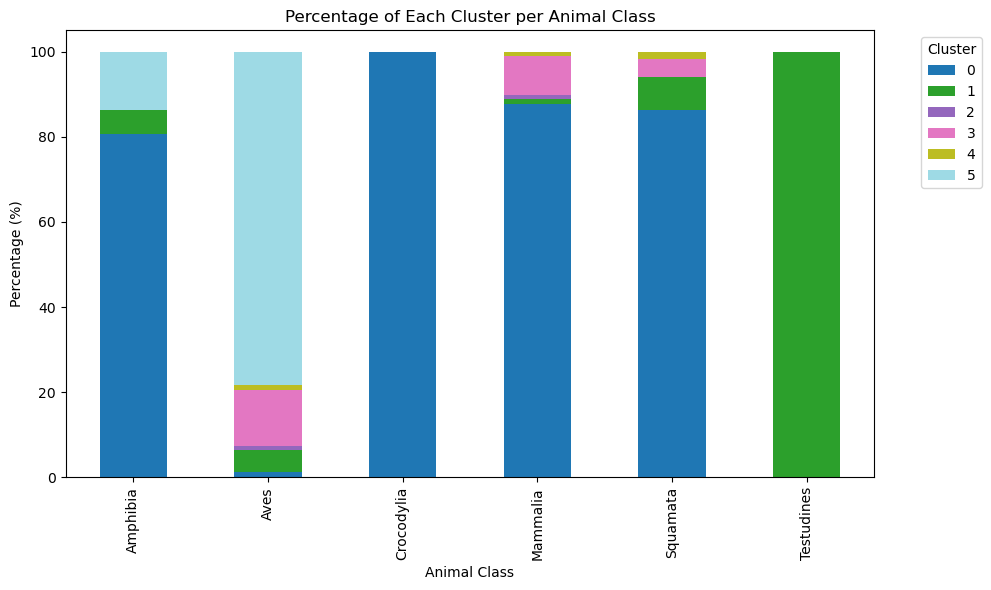

In [68]:
# Count the number of each cluster in each class
cluster_counts = merged_df.groupby(['class', 'Cluster']).size().unstack().fillna(0)

# Convert counts to percentages for each class
cluster_percentages = cluster_counts.div(cluster_counts.sum(axis=1), axis=0) * 100

# Plot the percentage of each cluster per animal class
cluster_percentages.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='tab20')
plt.title('Percentage of Each Cluster per Animal Class')
plt.xlabel('Animal Class')
plt.ylabel('Percentage (%)')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()